# Ball Tracking

In [1]:
%load_ext autoreload
%autoreload 2

## Prepare dataset

First, we'll prepare the dataset. To perform tuning we also need the ground truth tracking data.

In [42]:
import sportslabkit as slk

root = slk.utils.get_git_root()

dataset_path = slk.datasets.get_path('top_view')
path_to_csv = sorted(dataset_path.glob('annotations/*.csv'))[-1]
path_to_mp4 = sorted(dataset_path.glob('videos/*.mp4'))[-1]

bbdf_gt = slk.load_df(path_to_csv) # We will use this as ground truth
cam = slk.Camera(path_to_mp4) # Camera object will be used to load frames

Next, we will use the `get_data` funciton to isolate the ground truth data regarding the ball.

In [60]:
bbdf_gt = bbdf_gt.get_data(teamid='BALL')
bbdf_gt.head()

TeamID          BALL                              
PlayerID        BALL                              
Attributes bb_height bb_left  bb_top bb_width conf
frame                                             
1               16.0  2244.0  1624.0     16.0  1.0
2               13.0  2237.0  1626.0     15.0  1.0
3               13.0  2230.9  1627.9     15.0  1.0
4               13.0  2224.8  1629.8     15.0  1.0
5               13.0  2218.7  1631.7     15.0  1.0

## Prepare the detection model 

Although the original paper uses the Faster Region CNN (FrRCNN) detection framework for object detection, we will use fine-tuned YOLOv8 models trained on the soccertrack drone dataset as it is faster and more accurate. The model checkpoints can be downloaded from [here](https://drive.google.com/drive/u/1/folders/1XPQS5xr-NidQM78eAw5AJjZ5gsbSqu3j). Change the path in `model` accordingly.

     bbox_left     bbox_top  bbox_width  bbox_height      conf  class
0   450.195831  1881.303223   13.981934    13.116943  0.441603    1.0
1  2242.265015  1623.762085   18.089111    17.664551  0.405767    1.0


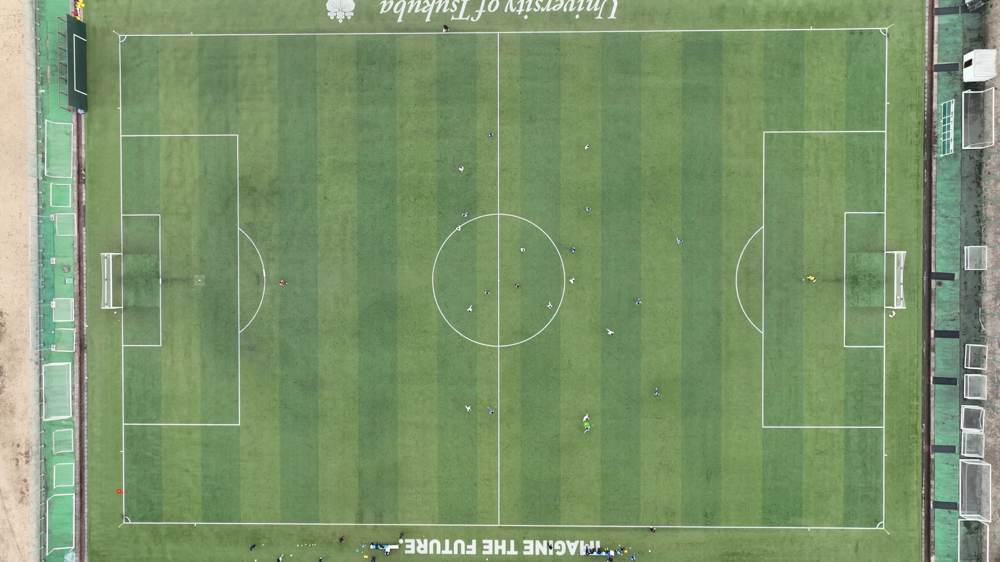

In [37]:
frame = cam[0]

det_model = slk.detection_model.load(
    'yolov8',
    model='/Users/atom/Github/SoccerTrack/models/yolov8/soccer_top_view-model=yolov8x-imgsz=2048.pt', # path to the checkpoint file
    classes=[1], # class index of ball to be detected
    imgsz=2560,
)

det_result = det_model(frame)[0]

print(det_result.to_df())
det_result.show(width=5)

## Prepare image model and motion models

In [38]:
image_model = slk.image_model.load('OSNet_ibn_x1_0')
motion_model = slk.motion_model.load('KalmanFilter')

## Tracking with MOT models (DeepSORT)

In [39]:
from sportslabkit.mot import DeepSORTTracker

sot_tracker = DeepSORTTracker(
    detection_model=det_model,
    image_model=image_model,
    motion_model=motion_model,
    t_lost=30
)

bbdf_pred = sot_tracker.track(cam)

Tracking Progress: 100%|██████████| 5/5 [03:50<00:00, 46.08s/it]


In [56]:
from sportslabkit.metrics import hota_score

hota_score(bbdf_pred, bbdf_gt)['HOTA']

0.0017946913726801048

In [57]:
bbdf_pred

TeamID                0                                               \
PlayerID   290632499624                                                
Attributes      bb_left       bb_top   bb_width  bb_height      conf   
frame                                                                  
1            450.195831  1881.303223  13.981934  13.116943  0.441603   
2            450.102631  1881.283081  14.078064  13.207764  0.481611   
3            449.948105  1881.270264  14.048859  13.108887  0.384033   
4            449.968140  1881.298828  14.030457  13.097900  0.410186   
5            450.003662  1881.344238  13.965088  13.010742  0.398025   

TeamID                                                                ...  \
PlayerID   270850788668                                               ...   
Attributes      bb_left       bb_top   bb_width  bb_height      conf  ...   
frame                                                                 ...   
1                   NaN          NaN        NaN        NaN       NaN  ...   
2           3080.377441  1070.371338  11.661621  11.689697  0.266739  ...   
3           3080.045898  1070.535461  11.573730  11.370483  0.292212  ...   
4           3080.028442  1070.580261  11.523193  11.494263  0.264180  ...   
5                   NaN          NaN        NaN        NaN       NaN  ...   

TeamID                                                                \
PlayerID   136698631180                                                
Attributes      bb_left       bb_top   bb_width  bb_height      conf   
frame                                                                  
1                   NaN          NaN        NaN        NaN       NaN   
2                   NaN          NaN        NaN        NaN       NaN   
3                   NaN          NaN        NaN        NaN       NaN   
4                   NaN          NaN        NaN        NaN       NaN   
5           2219.290283  1632.314209  14.240234  13.228271  0.784271   

TeamID                                                                
PlayerID   195779115031                                               
Attributes      bb_left       bb_top   bb_width  bb_height      conf  
frame                                                                 
1           2242.265015  1623.762085  18.089111  17.664551  0.405767  
2                   NaN          NaN        NaN        NaN       NaN  
3                   NaN          NaN        NaN        NaN       NaN  
4                   NaN          NaN        NaN        NaN       NaN  
5                   NaN          NaN        NaN        NaN       NaN  

[5 rows x 30 columns]

In [58]:
bbdf_gt

TeamID          BALL                                        
PlayerID        BALL                                        
Attributes bb_height      bb_left       bb_top bb_width conf
frame                                                       
1               16.0  2244.000000  1624.000000     16.0  1.0
2               13.0  2237.000000  1626.000000     15.0  1.0
3               13.0  2230.900000  1627.900000     15.0  1.0
4               13.0  2224.800000  1629.800000     15.0  1.0
5               13.0  2218.700000  1631.700000     15.0  1.0
...              ...          ...          ...      ...  ...
896             13.0  2737.571429   882.857143     15.0  1.0
897             13.0  2735.428571   882.142857     15.0  1.0
898             13.0  2733.285714   881.428571     15.0  1.0
899             13.0  2731.142857   880.714286     15.0  1.0
900             13.0  2729.000000   880.000000     15.0  1.0

[900 rows x 5 columns]

In [27]:
from sportslabkit.sot import MinimumCostFlowTracker


motion_model = slk.motion_model.load('KalmanFilter')

initial_target = det_result.preds[0, :4].astype(int)
initial_frame = cam[0]

target = {'box': initial_target}
tracker = MinimumCostFlowTracker(target, initial_frame, detection_model=det_model, motion_model=motion_model)

TypeError: BaseMotionModel.update() missing 1 required positional argument: 'states'

In [10]:
res = tracker.track(cam[:5])


0: 1440x2560 2 balls, 18255.3ms
Speed: 169.7ms preprocess, 18255.3ms inference, 41.8ms postprocess per image at shape (1, 3, 1440, 2560)

0: 1440x2560 2 balls, 24629.5ms
Speed: 85.2ms preprocess, 24629.5ms inference, 45.7ms postprocess per image at shape (1, 3, 1440, 2560)

0: 1440x2560 3 balls, 23456.5ms
Speed: 144.6ms preprocess, 23456.5ms inference, 6.2ms postprocess per image at shape (1, 3, 1440, 2560)

0: 1440x2560 3 balls, 21491.7ms
Speed: 159.2ms preprocess, 21491.7ms inference, 3.5ms postprocess per image at shape (1, 3, 1440, 2560)

0: 1440x2560 2 balls, 20906.0ms
Speed: 140.9ms preprocess, 20906.0ms inference, 2.0ms postprocess per image at shape (1, 3, 1440, 2560)

0: 1440x2560 2 balls, 26797.5ms
Speed: 145.7ms preprocess, 26797.5ms inference, 3.6ms postprocess per image at shape (1, 3, 1440, 2560)

0: 1440x2560 2 balls, 29723.3ms
Speed: 166.3ms preprocess, 29723.3ms inference, 49.6ms postprocess per image at shape (1, 3, 1440, 2560)

0: 1440x2560 3 balls, 34888.3ms
Speed:

TypeError: 'NoneType' object is not callable

## Model Tuning

Each tunable component will have an associated class variable named `hparam_search_space`. This is a nested dictionary that contains key-value pairs in the format `param: {"type": "categorical", "values": list of possible values}` for a categorical search space, or `param: {"type": 'logfloat', "low": min value, "high": max value}` for a continuous search space.

For instance, a `KalmanFilterMotionModel` has the following hyperparameter search space:


In [11]:
from sportslabkit.metrics.object_detection import ap_score

gt = bbdf.to_list_of_tuples_format({"TeamID": {"BALL": "ball"}, "PlayerID":{}})
gt = gt[gt[:, -3] == "ball"][:, :-1]

gt[:, -1] = gt[:, -1].astype(str)

ap_score(gt, gt, 0.5)['AP']

1.0

## Perform detection on all frames

In [5]:
from soccertrack.logger import tqdm

results = []
cam._seek(0) # TODO: this is a hack, should be fixed in the Camera class
for image, frame in enumerate(tqdm(cam)):
    im = frame
    det_result = det_model(frame, size = 2000)
    results.append(det_result)

100%|██████████| 900/900 [08:58<00:00,  1.67it/s]


In [23]:
# Calculate the average number of detections per frame
print(f"Average number of detections per frame: {sum([len(r) for r in results])/len(results)}")

# Calculate the minimum and maximum number of detections per frame
print(f"Minimum number of detections per frame: {min([len(r) for r in results])}")
print(f"Maximum number of detections per frame: {max([len(r) for r in results])}")

Average number of detections per frame: 7.656666666666666
Minimum number of detections per frame: 3
Maximum number of detections per frame: 10


In [6]:
# TODO: this should be fixed in the soccertrack library
# This is a hack to get the ground truth in the same format as the predictions

import numpy as np
y_preds = []
y_gts = []
for frame_num, det_result in enumerate(results):
    if len(det_result.pred) != 0:
        df_pred = det_result.to_df()
        df_pred["image_name"] = str(frame_num)
        y_preds += df_pred.values.tolist()

    y_gt = bbdf.get_frame(frame_num).to_list_of_tuples_format({"TeamID": {"BALL": "ball"}, "PlayerID":{}})[:, :7]
    if len(y_gt) > 0:
        y_gts += list(y_gt)

y_preds = np.array(y_preds, dtype=object)
y_gts = np.array(y_gts, dtype=object)

y_preds[:, 5] = 'ball'
y_gts = y_gts[y_gts[:, 5] == "ball"]

In [24]:
# Ground truth and predictions should have the same format
print(y_preds[:4])
print(y_gts[:4])

[[1717.16162109375 108.99951934814453 10.9400634765625 9.938446044921875 0.7088722586631775 'ball' '0']
 [449.9795837402344 1881.2650146484375 13.18353271484375 12.581298828125 0.542664647102356 'ball' '0']
 [760.5283203125 1071.2052001953125 12.95013427734375 12.173095703125 0.18674711883068085 'ball' '0']
 [3079.381591796875 1068.93994140625 14.6396484375 13.4447021484375 0.09726940095424652 'ball' '0']]
[[2244.0 1624.0 16.0 16.0 1.0 'ball' '1']
 [2237.0 1626.0 15.0 13.0 1.0 'ball' '2']
 [2230.9 1627.9 15.0 13.0 1.0 'ball' '3']
 [2224.8 1629.8 15.0 13.0 1.0 'ball' '4']]


In [25]:
from soccertrack.metrics.object_detection import map_score

score = map_score(bboxes_det=y_preds, bboxes_gt=y_gts, iou_threshold=0.1)
score

0.1062275610648276

## Draw Detection Results

In [9]:
from soccertrack.utils import make_video
from soccertrack.utils.draw import draw_bounding_boxes
import numpy as np

def draw_func(results, cam, **kwargs):
    
    n_frames = len(cam)
    for i in range(n_frames):
        frame = cam[i]
        bboxes = results[i]
    
        if len(bboxes) <= 0:
            continue
        
        image = draw_bounding_boxes(frame, bboxes, **kwargs)

        yield np.array(image)[:, :, ::-1]

In [10]:
no_mfc_bboxes = []

for frame_num, bboxes in enumerate(results):
    bboxes = bboxes.pred
    if bboxes.shape[0] <= 0:
        bboxes = np.zeros((0, 4))
    else:
        bboxes = bboxes[:, :4]
    no_mfc_bboxes.append(bboxes)

make_video(draw_func(no_mfc_bboxes, cam, colors='red', width=5), "output_without_mcf.mp4", input_framerate=30)

Writing video: 900it [01:06, 13.51it/s]


## Draw Min-Cost-Flow results

In [11]:
%matplotlib inline
import networkx as nx
import matplotlib.pyplot as plt

def gaussian_prob(x, mean=0, sigma=1):
    return (1 / (np.sqrt(2 * np.pi) * sigma)) * np.exp(-0.5 * ((x - mean) / sigma) ** 2)

def sigmoid(x, L=1, k=1, x0=0):
    return L / (1 + np.exp(-k * (x - x0)))


def find_shortest_path(results=1, L1=1, k1=1, L2=1, k2=1, dist_fill=10, conf_fill=0):
    # create flow graph connecting detections in consecutive frames
    n_frames = len(results) - 1

    G = nx.Graph()
    for frame_id in range(n_frames): # iterate over frames
        # add dummy node for frame
        G.add_node((frame_id, -1))
        
        n_detections = len(results[frame_id])
        for detection_id in range(n_detections): # iterate over detections in frame
            # add node for detection
            G.add_node((frame_id, detection_id))

    # iterate over frames
    for i in range(len(results)-1):
        # select nodes from frame i
        nodes0 = [(i, j) for j in range(len(results[i]))] + [(i, -1)]
        # select nodes from frame i+1
        nodes1 = [(i+1, j) for j in range(len(results[i+1]))] + [(i+1, -1)]

        # connect nodes from frame i to nodes in frame i+1
        # x_frame: frame number
        # x_det_n: detection number
        for (j_frame, j_det) in nodes0:
            for (k_frame, k_det) in nodes1:
                if j_det == -1 or k_det == -1:
                    distance = dist_fill
                    confidence = conf_fill
                else:
                    confidence = results[i][j_det][4]
                    distance = np.linalg.norm(results[i][j_det][:2] - results[i+1][k_det][:2])
                
                cost = sigmoid((1 - confidence), L=L1, k=k1) + sigmoid(distance, L=L2, k=k2)
                G.add_edge((j_frame, j_det), (k_frame, k_det), weight=cost)
    
    # calculate shortest path
    path = nx.shortest_path(G, source=(0, -1), target=(n_frames-2, -1), weight='weight')
    path_length = nx.shortest_path_length(G, source=(0, -1), target=(n_frames-2, -1), weight='weight')
    return path, path_length

# visualize shortest path on top of flow graph with red lines
# pos = {}
# for i in range(len(results)):
#     nodes = [n for n in G.nodes() if n[0] == i]
#     for j, node in enumerate(nodes):
#         pos[node] = (i, j)
#     if i==n_frames+2: break

# fig, ax = plt.subplots(figsize=(10, 10))
# nx.draw(G, pos, node_size=25, ax=ax, node_color='black', edge_color='black', width=0.25, with_labels=True)
# nx.draw_networkx_nodes(G, pos, nodelist=path, node_size=100, node_color='r', ax=ax)
# nx.draw_networkx_edges(G, pos, edgelist=[(path[i], path[i+1]) for i in range(len(path)-1)], edge_color='r', ax=ax)
# ax.set_title("Shortest path")

# plt.show()

In [12]:
from copy import deepcopy
def update_results(results, path):
    results = deepcopy(results)
    updated_results = []
    for i in range(len(results)):
        frame = results[i].copy()
        updated_frame = []
        for j in range(len(frame)):
            detection = frame[j]
            if (i, j) in path:
                updated_frame.append(detection)
        updated_results.append(updated_frame)

    # forward fill in missing detections
    for i in range(len(updated_results)):
        if len(updated_results[i]) == 0 and i > 0:
            updated_results[i] = updated_results[i-1]
            if len(updated_results[i]) > 0:
                updated_results[i][0][:4] = np.nan
            
    # backward fill in missing detections
    for i in range(len(updated_results)-1, -1, -1):
        if len(updated_results[i]) == 0 and i < len(updated_results) - 1:
            updated_results[i] = updated_results[i+1]
            updated_results[i][0][:4] = np.nan
            
    updated_results = np.array(updated_results).squeeze()
    for i in range(len(updated_results)):
        updated_results[i][5] = i

    updated_results = updated_results.astype(object)
    updated_results[:, 5] = updated_results[:, 5].astype(int).astype(str)
    updated_results = np.insert(updated_results, 5, 'ball', axis=1)
    
    bboxes = updated_results[:, :4]
    bboxes = bboxes.astype(float)
    for x in bboxes.T:
        x[np.isnan(x)] = np.interp(np.flatnonzero(np.isnan(x)), np.flatnonzero(~np.isnan(x)), x[~np.isnan(x)])
    updated_results[:, :4] = bboxes
    
    # remove results with nan
    updated_results = updated_results[~np.isnan(updated_results[:, 0].astype(float))]
    # print(updated_results)
    return updated_results


bboxes = [bbox.pred for bbox in results]
path, path_length = find_shortest_path(bboxes)
updated_results = update_results(bboxes, path)
map_score(bboxes_det=updated_results, bboxes_gt=y_gts, iou_threshold=0.1)

(0.0, 1000.3476169840518)

In [13]:
import optuna

class TqdmCallback:
    def __init__(self, total_trials):
        self.pbar = tqdm(total=total_trials, desc="Optimizing", ncols=80)

    def __call__(self, study, trial):
        best_value = study.best_value
        self.pbar.set_description(f"Best value: {best_value:.4f}")
        self.pbar.update(1)

    def close(self):
        self.pbar.close()


def objective(trial):
    dist_fill = trial.suggest_float('dist_fill', 0, 10000)
    conf_fill = trial.suggest_float('conf_fill', 0, 1)
    
    L1 = trial.suggest_float('L1', 0, 20000)
    k1 = trial.suggest_float('k1', 0, 20000)
    L2 = trial.suggest_float('L2', 0, 20000)
    k2 = trial.suggest_float('k2', 0, 20000)

    try:
        path, path_length = find_shortest_path(bboxes, dist_fill=dist_fill, conf_fill=conf_fill, L1=L1, k1=k1, L2=L2, k2=k2)
        updated_results = update_results(bboxes, path)
        ap = ap_score(updated_results, gt, 0.1)['AP']
    except:
        ap = 0
    
    return ap#, path_length

optuna.logging.set_verbosity(optuna.logging.WARNING)

n_trials = 1000
callback = TqdmCallback(total_trials=n_trials)
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=n_trials, callbacks=[callback])
# Close the progress bar
callback.close()

print("Best trial:")
trial = study.best_trial
print("  Value: ", trial.value)
print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

Best value: 0.0555: 100%|███████████████| 10000/10000 [2:18:22<00:00,  1.20it/s]

Best trial:
  Value:  0.05545664013405949
  Params: 
    dist_fill: 5405.219798624805
    conf_fill: 0.22261572636776156
    L1: 16020.088942053233
    k1: 14636.351872112275
    L2: 14838.261079888955
    k2: 9886.127302662333


In [14]:
# Best trial:
#   Value:  0.6156990003417696
#   Params: 
#     dist_fill: 9522.710012275107
#     conf_fill: 0.5538963501926321
#     L1: 12631.771902027638
#     k1: 5.400862662789353
#     L2: 9056.581857493275
#     k2: 13247.17761307754

/var/folders/6m/8_2yd721373cx0m954405yd00000gn/T/ipykernel_8879/2203811637.py:3: ExperimentalWarning: plot_contour is experimental (supported from v2.2.0). The interface can change in the future.
  ax = optuna.visualization.matplotlib.plot_contour(study, params=['k1', 'k2'], target_name='AP')
[W 2023-04-21 06:21:55,931] Output figures of this Matplotlib-based `plot_contour` function would be different from those of the Plotly-based `plot_contour`.


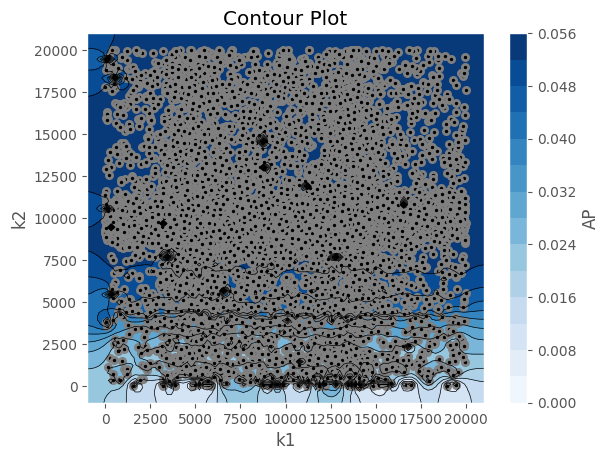

In [15]:
import matplotlib as mpl

ax = optuna.visualization.matplotlib.plot_contour(study, params=['k1', 'k2'], target_name='AP')

/var/folders/6m/8_2yd721373cx0m954405yd00000gn/T/ipykernel_8879/1036994904.py:1: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  optuna.visualization.matplotlib.plot_param_importances(study)


<AxesSubplot: title={'center': 'Hyperparameter Importances'}, xlabel='Importance for Objective Value', ylabel='Hyperparameter'>

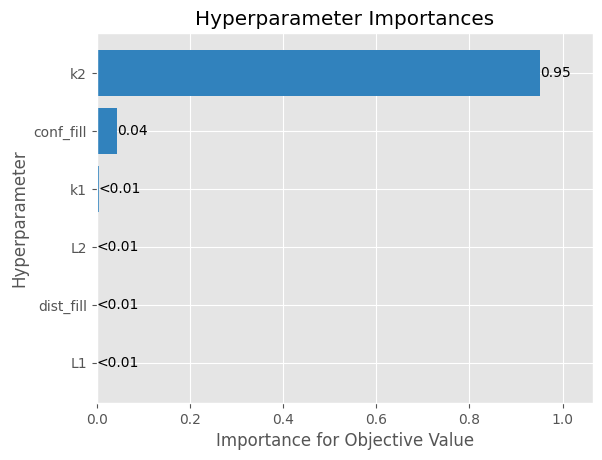

In [16]:
optuna.visualization.matplotlib.plot_param_importances(study)

In [20]:
from soccertrack.utils import make_video
import numpy as np

path, path_length = find_shortest_path(
    bboxes,
    dist_fill=trial.params["dist_fill"],
    conf_fill=trial.params["conf_fill"],
    L1=trial.params["L1"],
    k1=trial.params["k1"],
    L2=trial.params["L2"],
    k2=trial.params["k2"],
)
path, path_length = find_shortest_path(
    bboxes,
    dist_fill=9000,
    conf_fill=0.5,
    L1=12000,
    k1=5,
    L2=9000,
    k2=13000,
)
# Best trial:
#   Value:  0.6156990003417696
#   Params: 
#     dist_fill: 9522.710012275107
#     conf_fill: 0.5538963501926321
#     L1: 12631.771902027638
#     k1: 5.400862662789353
#     L2: 9056.581857493275
#     k2: 13247.17761307754
updated_results = update_results(bboxes, path)

boxes = np.expand_dims(updated_results[:, :4], axis=1)
make_video(
    draw_func(boxes, cam, colors=["red"], width=3),
    "output_with_mcf.mp4",
    input_framerate=30,
)


Writing video: 900it [00:56, 15.94it/s]


In [18]:
# from soccertrack.metrics import ap_score

# n_frames = len(results)
# # create flow graph connecting detections in consecutive frames
# G = nx.Graph()
# for i in range(len(results)-1): # iterate over frames
#     # add dummy nodes for frame i
#     G.add_node((i, -1))
    
#     for j in range(len(results[i])): # iterate over detections in frame i
#         # add node for detection j in frame i
#         G.add_node((i, j))
    
#     if i > n_frames:
#         break


# dist_param = 10
# ap_scores = []
# for dist_param in np.linspace(0, 3000, 100):
#     # iterate over frames
#     for i in range(len(results)-1):
#         # select nodes from frame i
#         nodes0 = [n for n in G.nodes() if n[0] == i]
#         # select nodes from frame i+1
#         nodes1 = [n for n in G.nodes() if n[0] == i+1]

#         # connect nodes from frame i to nodes in frame i+1
#         # xframe: frame number
#         # xdet_n: detection number
#         for (jframe, jdet_n) in nodes0:
#             for (kframe, kdet_n) in nodes1:
#                 if jdet_n == -1 or kdet_n == -1:
#                     dist = dist_param
#                 else:
#                     dist = np.linalg.norm(results[i][jdet_n][:2] - results[i+1][kdet_n][:2])
#                 G.add_edge((jframe, jdet_n), (kframe, kdet_n), weight=dist)

#     # calculate shortest path
#     path = nx.shortest_path(G, source=(0, -1), target=(n_frames-2, -1), weight='weight')

#     y_preds = []
#     y_gts = []
#     for frame_num, det_result in enumerate(results):

#         # remove results that are not in path
#         det_idx = path[frame_num][1]
#         if det_idx != -1:
#             y_pred = [
#                 results[frame_num][det_idx].tolist()[:-1]
#                 + [str(int(results[frame_num][det_idx].tolist()[-1]))]
#                 + [str(frame_num)]
#             ]
#         else:
#             y_pred = [[np.nan, np.nan, np.nan, np.nan, 0, '0', str(frame_num)]]
#         y_gt = (
#             bbdf.get_frame(frame_num)
#             .xs("BALL", level="TeamID", axis=1, drop_level=False)
#             .to_list_of_tuples_format(mapping={"TeamID": {"BALL": "0"}, "PlayerID": {}})[:, :7]
#         )
#         y_gt[:, 6] = str(y_gt[:, 6])
#         y_gt = y_gt.tolist()

#         y_preds += y_pred
#         y_gts += y_gt

#         if frame_num == n_frames-10:
#             break

#     y_preds = np.array(y_preds, dtype=object)
#     y_gts = np.array(y_gts, dtype=object)
    
#     # interpolate nan values in y_preds
#     from scipy.interpolate import interp1d
#     if not all(np.isnan(y_preds[:, 0].astype(float))):
#         y_preds_interp = []
#         for i in range(y_preds.shape[1]):
#             if i >= 5:
#                 y_preds_interp.append(y_preds[:, i])
#                 continue
#             x = np.arange(y_preds.shape[0])
#             y = y_preds[:, i].astype(float)
#             y[np.isnan(y)] = np.interp(x[np.isnan(y)], x[~np.isnan(y)], y[~np.isnan(y)])
#             y_preds_interp.append(y)
#         y_preds = np.array(y_preds_interp).T

#         ball_ap = ap_score(
#             bboxes_det_per_class=y_preds,
#             bboxes_gt_per_class=y_gts,
#             iou_threshold=0.2,
#         )["AP"]
#     else:
#         ball_ap = 0

#     print(f"Ball AP: {ball_ap}")
#     ap_scores.append(ball_ap)



# # plot AP scores in a pretty way
# fig, ax = plt.subplots(figsize=(10, 10))
# ax.plot(np.linspace(0, 3000, 100), ap_scores)
# ax.set_xlabel("Distance parameter")
# ax.set_ylabel("Ball AP")
# ax.set_title("AP score vs distance parameter")
# plt.show()

In [19]:
# from soccertrack.utils import make_video
# import numpy as np

# def draw_func_2():
#     for i, frame in enumerate(cam.iter_frames()):
#         im = frame[:,:,::-1]
        
#         res = np.array([y_preds[i][:4].astype(float)])
#         im = soccertrack.utils.draw.draw_bounding_boxes(im, res)
        
#         yield np.array(im)[:,:,::-1]
#         if i > n_frames-15:
#             break
    
# make_video(draw_func_2(), "output.mp4")